In [1]:
pip install xarray netCDF4 h5netcdf geopandas matplotlib folium ffmpeg rioxarray

Note: you may need to restart the kernel to use updated packages.


In [2]:
import xarray as xr
import rioxarray as rio
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML, display

In [3]:
data_cube = xr.open_dataset('data/geospatial_test_datacube.nc', engine='netcdf4')
data_cube = data_cube.rio.write_crs("epsg:4326")
print(f"{data_cube=}\n")

print("-"*40)

aoi = gpd.read_file('data/geospatial_sub_aoi.geojson')
print(f"\n{aoi=}")

data_cube=<xarray.Dataset> Size: 25MB
Dimensions:      (time: 23, y: 227, x: 304)
Coordinates:
  * time         (time) datetime64[ns] 184B 2021-04-09 2021-04-14 ... 2021-11-25
  * y            (y) float32 908B 45.23 45.23 45.23 45.23 ... 45.21 45.21 45.21
  * x            (x) float32 1kB -69.95 -69.95 -69.95 ... -69.92 -69.92 -69.92
    spatial_ref  int64 8B 0
Data variables:
    S2_RED       (time, y, x) float32 6MB ...
    S2_GREEN     (time, y, x) float32 6MB ...
    S2_BLUE      (time, y, x) float32 6MB ...
    S2_NIR       (time, y, x) float32 6MB ...
Attributes:
    transform:        [ 8.98405270e-05  0.00000000e+00 -6.99499045e+01  0.000...
    res:              [8.98405270e-05 9.04387077e-05]
    descriptions:     ['RED', 'GREEN', 'BLUE', 'NIR']
    AREA_OR_POINT:    Area
    _FillValue:       nan
    s2_data_lineage:  {"Data origin": "S3 bucket (ARN=arn:aws:s3:::sentinel-c...
    ulx, uly:         [-69.94990454  45.23320715]

----------------------------------------

aoi=     

In [4]:
data_cube.isel(time=0)

<xarray.Dataset> Size: 1MB
Dimensions:      (y: 227, x: 304)
Coordinates:
    time         datetime64[ns] 8B 2021-04-09
  * y            (y) float32 908B 45.23 45.23 45.23 45.23 ... 45.21 45.21 45.21
  * x            (x) float32 1kB -69.95 -69.95 -69.95 ... -69.92 -69.92 -69.92
    spatial_ref  int64 8B 0
Data variables:
    S2_RED       (y, x) float32 276kB ...
    S2_GREEN     (y, x) float32 276kB ...
    S2_BLUE      (y, x) float32 276kB ...
    S2_NIR       (y, x) float32 276kB ...
Attributes:
    transform:        [ 8.98405270e-05  0.00000000e+00 -6.99499045e+01  0.000...
    res:              [8.98405270e-05 9.04387077e-05]
    descriptions:     ['RED', 'GREEN', 'BLUE', 'NIR']
    AREA_OR_POINT:    Area
    _FillValue:       nan
    s2_data_lineage:  {"Data origin": "S3 bucket (ARN=arn:aws:s3:::sentinel-c...
    ulx, uly:         [-69.94990454  45.23320715]

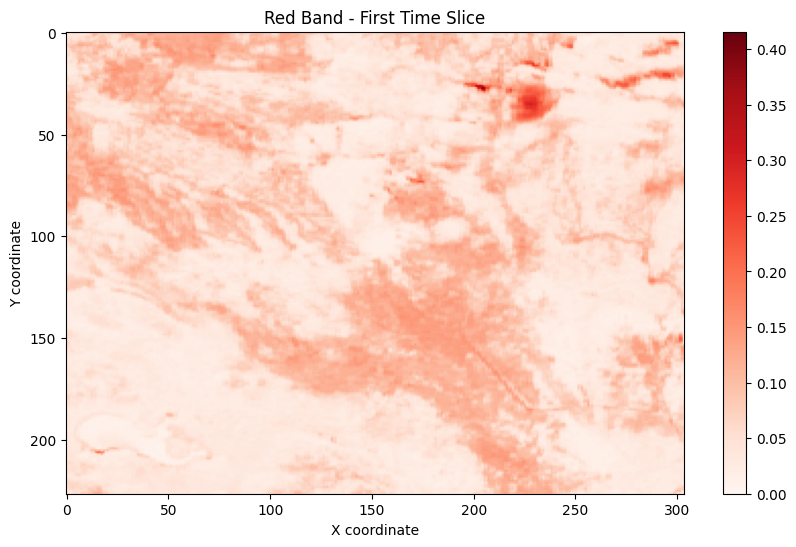

In [5]:
plt.figure(figsize=(10, 6))
plt.imshow(data_cube['S2_RED'].isel(time=0), cmap='Reds')
plt.colorbar()
plt.title('Red Band - First Time Slice')
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
plt.show()

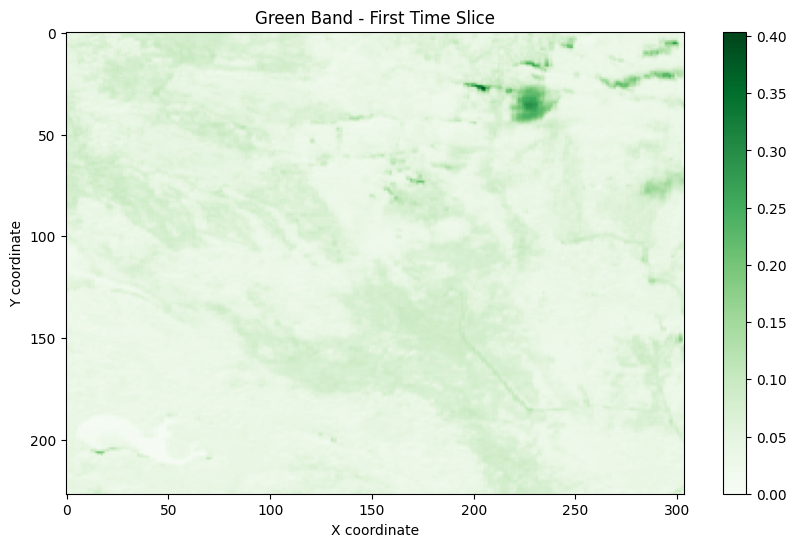

In [6]:
plt.figure(figsize=(10, 6))
plt.imshow(data_cube['S2_GREEN'].isel(time=0), cmap='Greens')
plt.colorbar()
plt.title('Green Band - First Time Slice')
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
plt.show()


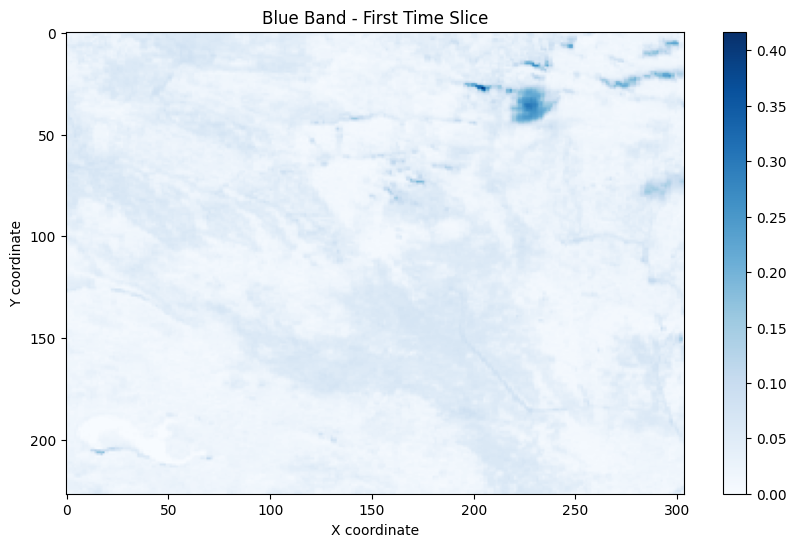

In [7]:
plt.figure(figsize=(10, 6))
plt.imshow(data_cube['S2_BLUE'].isel(time=0), cmap='Blues')
plt.colorbar()
plt.title('Blue Band - First Time Slice')
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
plt.show()


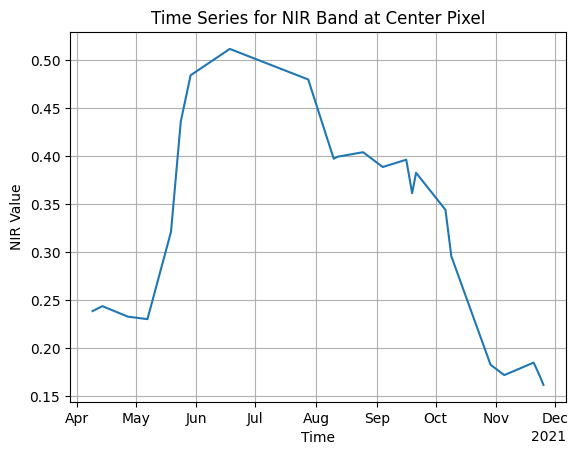

In [8]:
pixel_time_series = data_cube['S2_NIR'].isel(x=int(data_cube['x'].size / 2), y=int(data_cube['y'].size / 2))
pixel_time_series.plot()
plt.title('Time Series for NIR Band at Center Pixel')
plt.xlabel('Time')
plt.ylabel('NIR Value')
plt.grid(True)
plt.show()

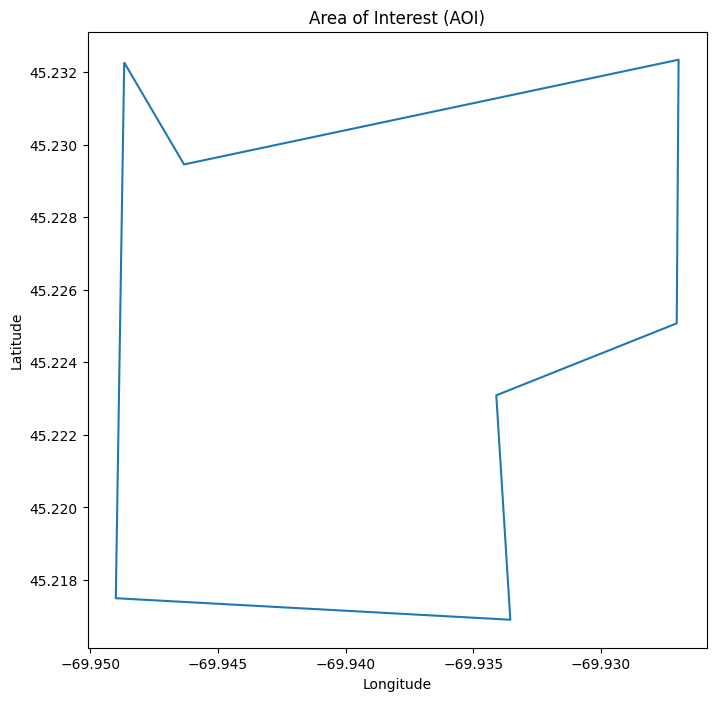

In [9]:
fig, ax = plt.subplots(figsize=(8, 8))
aoi.boundary.plot(ax=ax)
ax.set_title('Area of Interest (AOI)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

In [10]:
m = folium.Map(location=[45.23, -69.94], zoom_start=14, tiles='Esri.WorldImagery')

folium.GeoJson(aoi, name='geojson').add_to(m)
folium.LayerControl().add_to(m)

m.save('AOI_map.html')
m

In [11]:
m2 = folium.Map(location=[45.23, -69.94], zoom_start=14, tiles='OpenTopoMap')

folium.GeoJson(aoi, name='geojson').add_to(m2)
folium.LayerControl().add_to(m)

m2.save('AOI_map.html')
m2

From the coordinates we can see that our AOI is in Maine, United States.
We can see significant elevation changes, with some areas marked by tight contour intervals, indicating steep slopes. This can lead to microclimates within the AOI, affecting local weather patterns, vegetation types, and biodiversity.

The images shows a mix of forested areas and open spaces.

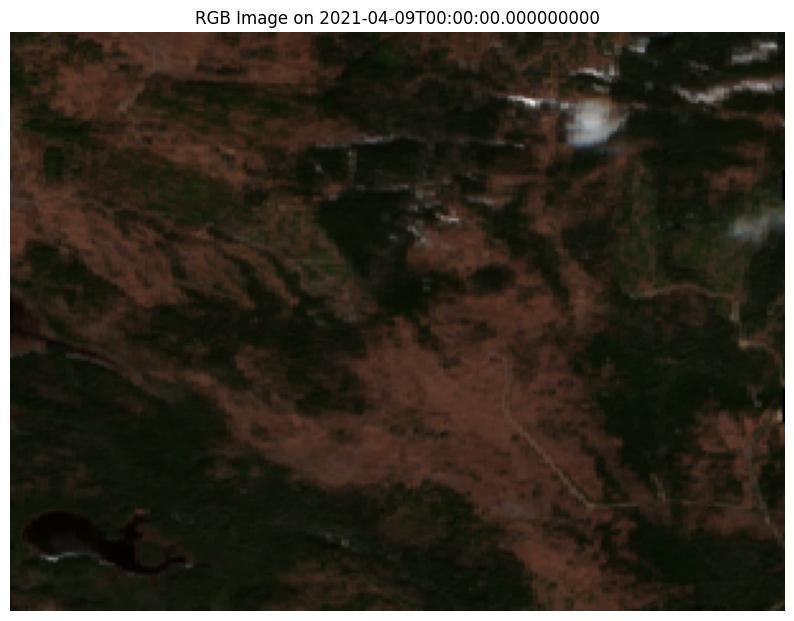

In [12]:
date_index = 0

red = data_cube['S2_RED'].isel(time=date_index)
green = data_cube['S2_GREEN'].isel(time=date_index)
blue = data_cube['S2_BLUE'].isel(time=date_index)

# stack the bands to form an RGB image
rgb = np.stack([red, green, blue], axis=-1)

# normalize for rgb data
rgb_normalized = (rgb - rgb.min()) / (rgb.max() - rgb.min())

# plot the image
plt.figure(figsize=(10, 10))
plt.imshow(rgb_normalized)
plt.title('RGB Image on ' + str(data_cube['time'].values[date_index]))
plt.axis('off')
plt.show()

By combining the red, blue and green wavelengths we can get a similar image as the map we have seen before. By changing the **date_index** parameter we can see the image as time passes.

Normalized Difference Vegetation Index (NDVI) is calculated using the formula NDVI=(NIR+Red)/(NIR−Red), where NIR is the near-infrared bar and Red is the Red band.

In [13]:
data_cube['NDVI'] = (data_cube['S2_NIR'] - data_cube['S2_RED']) / (data_cube['S2_NIR'] + data_cube['S2_RED'])

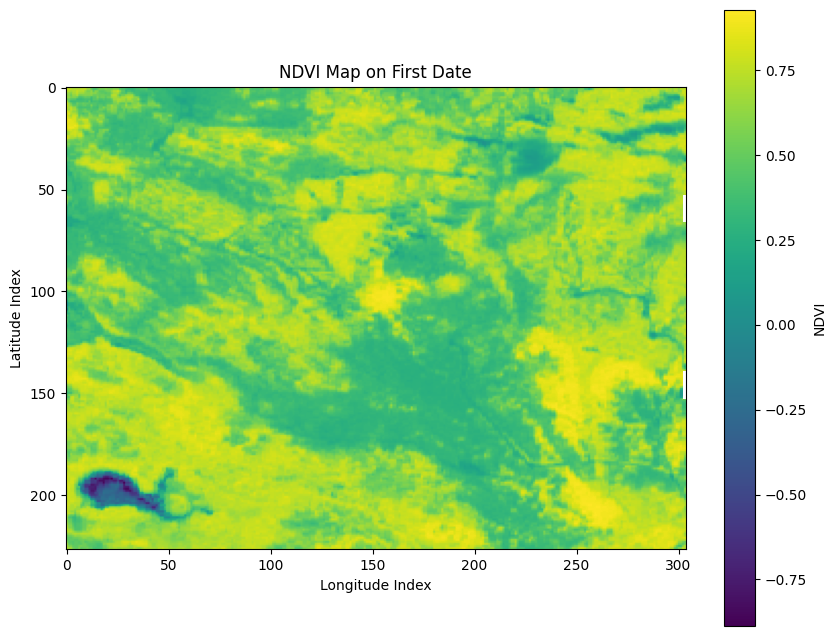

In [14]:
ndvi_snapshot = data_cube['NDVI'].isel(time=0)

# Plot NDVI map
plt.figure(figsize=(10, 8))
plt.imshow(ndvi_snapshot, cmap='viridis')
plt.colorbar(label='NDVI')
plt.title('NDVI Map on First Date')
plt.xlabel('Longitude Index')
plt.ylabel('Latitude Index')
plt.show()

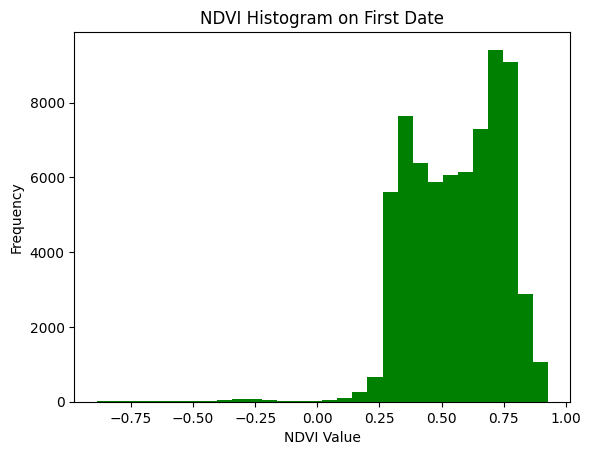

In [15]:
ndvi_values = data_cube['NDVI'].isel(time=0).values.flatten()

plt.hist(ndvi_values, bins=30, color='green')
plt.title('NDVI Histogram on First Date')
plt.xlabel('NDVI Value')
plt.ylabel('Frequency')
plt.show()

We can see that at the first date, i.e. around the start/mid April, most of the NDVI values are positive, which generally suggests that the area has a significant amount of vegetation.

There are very few negative values, which implies minimal presence of water bodies or bare ground in this snapshot.

This is the situation when the data was first gathered. Now we will look at a time series visualization of the data to understand how the vegetation evolved through time.

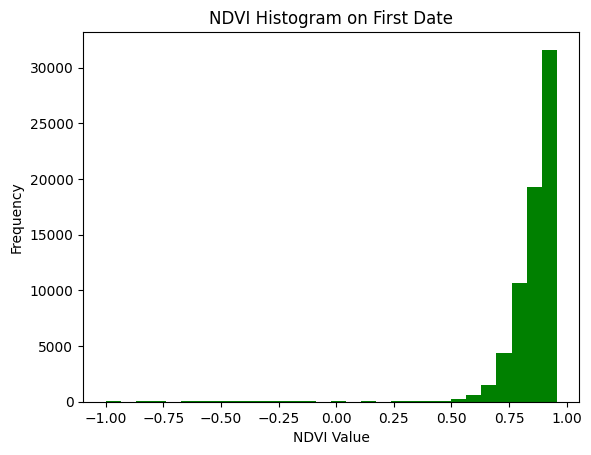

In [29]:
ndvi_values = data_cube['NDVI'].isel(time=7).values.flatten()

plt.hist(ndvi_values, bins=30, color='green')
plt.title('NDVI Histogram on First Date')
plt.xlabel('NDVI Value')
plt.ylabel('Frequency')
plt.show()

As we can see here, most of the NDVI values are positive, with much higher frequencies than the previous case. This is around July, where the NDVI is at its peak, which clearly shows in the graph.

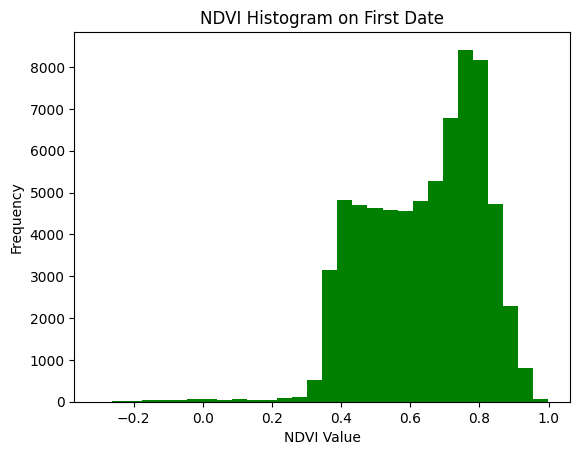

In [24]:
ndvi_values = data_cube['NDVI'].isel(time=22).values.flatten()

plt.hist(ndvi_values, bins=30, color='green')
plt.title('NDVI Histogram on First Date')
plt.xlabel('NDVI Value')
plt.ylabel('Frequency')
plt.show()

This histogram is from the last time available. It is very evident from the histogram that the NDVI its at its lowest, showing smaller frequency values.

### Time Series of NDVI Averaged Over the AOI

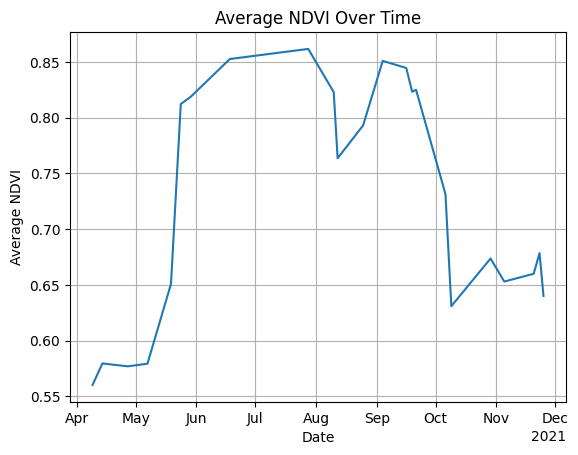

In [16]:
mean_ndvi = data_cube['NDVI'].mean(dim=['x', 'y'])

# Plotting the time series
mean_ndvi.plot()
plt.title('Average NDVI Over Time')
plt.xlabel('Date')
plt.ylabel('Average NDVI')
plt.grid(True)
plt.show()

We can better appreciate how NDVI changes through time with the following animation. (Not available on GitHub)

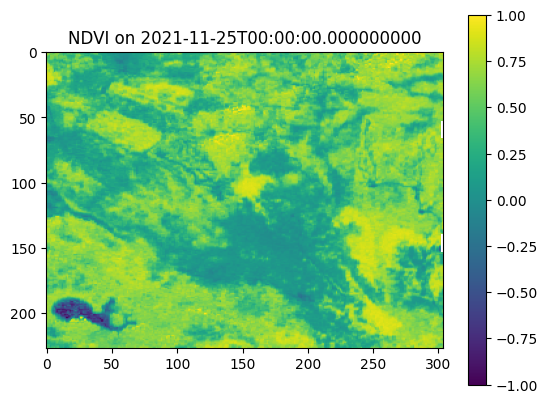

In [17]:
fig, ax = plt.subplots()

im = ax.imshow(data_cube['NDVI'].isel(time=0), cmap='viridis', vmin=-1, vmax=1)
plt.colorbar(im, ax=ax)
ax.set_title('NDVI Animation')

def update(frame):
    ax.clear()
    im = ax.imshow(data_cube['NDVI'].isel(time=frame), cmap='viridis')
    ax.set_title(f"NDVI on {data_cube['time'].values[frame]}")
    return im,

ani = animation.FuncAnimation(fig, update, frames=len(data_cube['time']), blit=True)

display(HTML(ani.to_jshtml()))

## **Description of the Data**

Let's make some statements based on the data we observed.

### **Spatial Distribution** 

The AOI is located in Maine, in the United States. The terrain within the AOI includes both flat areas and regions with significant elevation changes. These elevation changes could influence the local climate conditions such as moisture and sunlight, which are critical for vegetation.  
There are also some bodies of water around (and partially in) the Area Of Interest.

### **Evolution of Vegetation** 

From the time-series data that we plotted, we can see there is a *noticeable increase in NDVI from April, peaking around July*. This period corresponds to the growing season when temperatures are favorable and there is sufficient rainfall to support dense and healthy vegetation.  
Post summer, there is a constant decline of the NDVI until winter, where we can assume the values will stay quite low throughout the whole season.  
I should mention that the graph shows a **steep decline** in avg NDVI between the end of July and mid August. Looking more into it, we can attribute the sudden drop to severe weather events that occurred in Maine during that period. Notably, Maine experienced significant storm damage in late July 2021, with events that involved intense, localized winds causing tree damage and power outages. Such storms could certainly have contributed to the sharp decrease in NDVI values, as they would have resulted in potential damage to the vegetation.



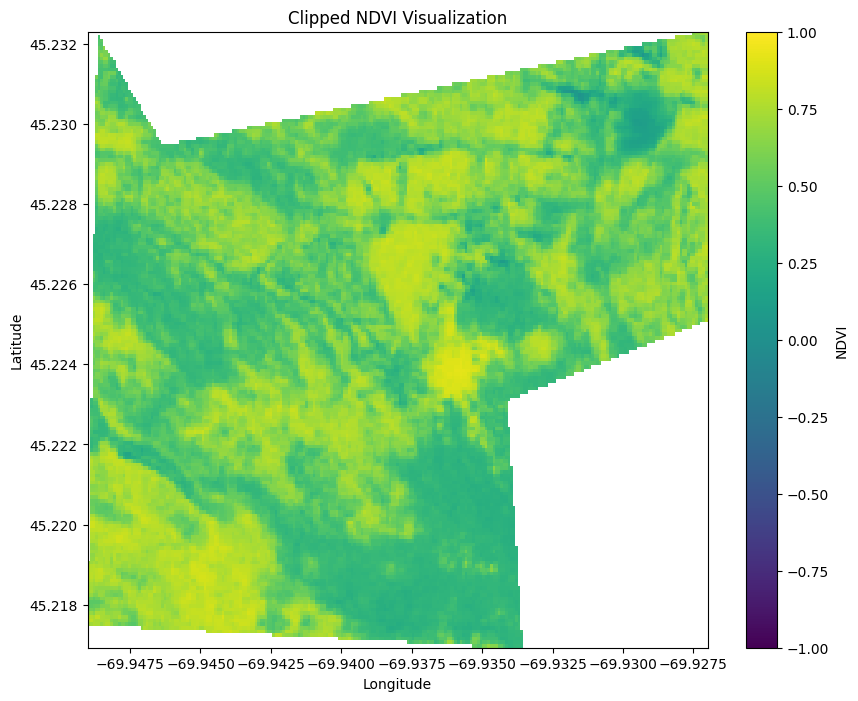

In [18]:
if data_cube.rio.crs != aoi.crs:
    aoi = aoi.to_crs(crs=data_cube.rio.crs.to_string())

clipped = data_cube['NDVI'].rio.clip(aoi.geometry, aoi.crs)

# visualize clipped NDVI data
plt.figure(figsize=(10, 8))
# extracting the first time step for visualization
ndvi_plot = clipped.isel(time=0).plot(cmap='viridis', add_colorbar=False, vmin=-1, vmax=1)

# add colorbar
cbar = plt.colorbar(ndvi_plot)
cbar.set_label('NDVI')

plt.title('Clipped NDVI Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

Here is the first step (around the start of April) of the NDVI Visualization. Now, here is an animation to further appreciate the change in NDVI as the time goes on.

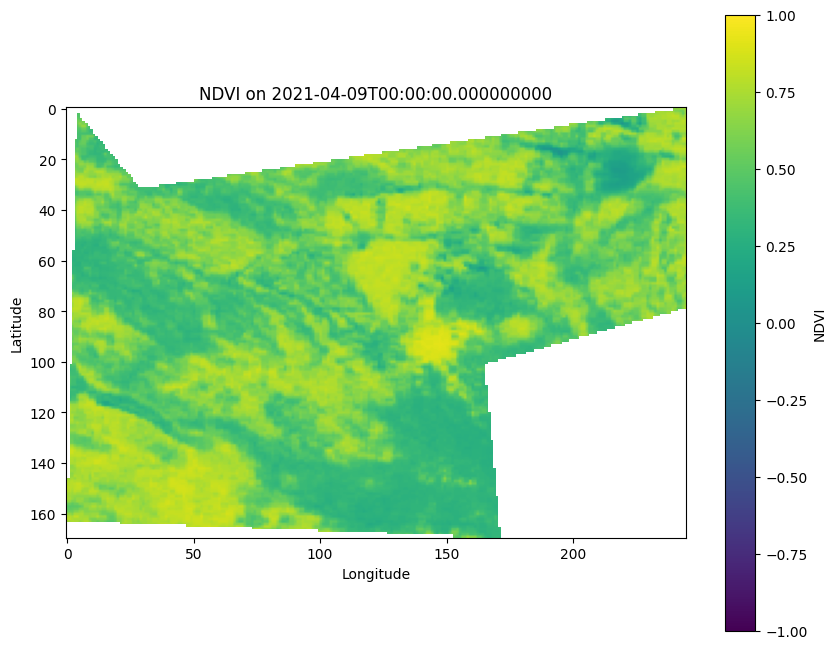

In [19]:
fig, ax = plt.subplots(figsize=(10, 8))

# initialize the animation with NDVI at time 0
im = ax.imshow(clipped.isel(time=0), cmap='viridis', vmin=-1, vmax=1)
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('NDVI')

def update(frame):
    """
    Update the plot for each frame to show NDVI for each time step
    """
    ax.clear()  # clear previous image
    im = ax.imshow(clipped.isel(time=frame), cmap='viridis', vmin=-1, vmax=1)
    ax.set_title(f"NDVI on {data_cube['time'].values[frame]}")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    return im,

# create animation
ani = animation.FuncAnimation(fig, update, frames=len(data_cube['time']), blit=False)

# display the animation
HTML(ani.to_jshtml())